# YOLOv9 on a Custom Dataset

## Before you start

Let's make sure that we have access to GPU. We can use `nvidia-smi` command to do that. In case of any problems navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`.

In [1]:
!nvidia-smi

Wed Jul 24 23:23:29 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 531.14                 Driver Version: 531.14       CUDA Version: 12.1     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                      TCC/WDDM | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf            Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA GeForce GTX 1060       WDDM | 00000000:01:00.0 Off |                  N/A |
| N/A   43C    P8                3W /  N/A|      0MiB /  6144MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [2]:
!python --version

Python 3.10.0


**NOTE:** To make it easier for us to manage datasets, images and models we create a `HOME` constant.

In [3]:
import os
HOME = os.getcwd()
print(HOME)

D:\Viren\AIKD\Pedestian


## Clone and Install

**NOTE:** YOLOv9 is very new. At the moment, we recommend using a fork of the main repository. The `detect.py` script contains a bug that prevents inference. This bug is patched in the fork.

In [3]:
!git clone https://github.com/SkalskiP/yolov9.git
%cd yolov9
!pip install -r requirements.txt -q

Cloning into 'yolov9'...
remote: Enumerating objects: 325, done.
remote: Total 325 (delta 0), reused 0 (delta 0), pack-reused 325
Receiving objects: 100% (325/325), 2.25 MiB | 5.13 MiB/s, done.
Resolving deltas: 100% (162/162), done.
/content/yolov9
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 4.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 6.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 14.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 42.6 MB/s eta 0:00:00


**NOTE:** Let's install the [`roboflow`](https://pypi.org/project/roboflow) package, which we will use to download our dataset from [Roboflow Universe](https://universe.roboflow.com/).

In [3]:
!pip install roboflow

You should consider upgrading via the 'D:\Viren\AIKD\Pedestian\vr\Scripts\python.exe -m pip install --upgrade pip' command.


## Download model weights

**NOTE:** In the YOLOv9 paper, versions `yolov9-s` and `yolov9-m` are also mentioned, but the weights for these models are not yet available in the YOLOv9 [repository](https://github.com/WongKinYiu/yolov9).

In [4]:
!wget -P {HOME}/weights -q https://github.com/WongKinYiu/yolov9/releases/download/v0.1/yolov9-c.pt
!wget -P {HOME}/weights -q https://github.com/WongKinYiu/yolov9/releases/download/v0.1/yolov9-e.pt
!wget -P {HOME}/weights -q https://github.com/WongKinYiu/yolov9/releases/download/v0.1/yolov9-s.pt
!wget -P {HOME}/weights -q https://github.com/WongKinYiu/yolov9/releases/download/v0.1/yolov9-m.pt
!wget -P {HOME}/weights -q https://github.com/WongKinYiu/yolov9/releases/download/v0.1/gelan-c.pt
!wget -P {HOME}/weights -q https://github.com/WongKinYiu/yolov9/releases/download/v0.1/gelan-e.pt
!wget -P {HOME}/weights -q https://github.com/WongKinYiu/yolov9/releases/download/v0.1/gelan-m.pt
!wget -P {HOME}/weights -q https://github.com/WongKinYiu/yolov9/releases/download/v0.1/gelan-s.pt

'wget' is not recognized as an internal or external command,
operable program or batch file.
'wget' is not recognized as an internal or external command,
operable program or batch file.
'wget' is not recognized as an internal or external command,
operable program or batch file.
'wget' is not recognized as an internal or external command,
operable program or batch file.
'wget' is not recognized as an internal or external command,
operable program or batch file.
'wget' is not recognized as an internal or external command,
operable program or batch file.
'wget' is not recognized as an internal or external command,
operable program or batch file.
'wget' is not recognized as an internal or external command,
operable program or batch file.


## Download example data

**NOTE:** If you want to run inference using your own file as input, simply upload image to Google Colab and update `SOURCE_IMAGE_PATH` with the path leading to your file.

In [10]:
!wget -P {HOME}/data -q https://media.roboflow.com/notebooks/examples/dog.jpeg

'wget' is not recognized as an internal or external command,
operable program or batch file.


In [8]:
SOURCE_IMAGE_PATH = f"{HOME}/dog.jpeg"

## Detection with pre-trained COCO model

**NOTE:** By default, the results of each subsequent inference sessions are saved in `{HOME}/yolov9/runs/detect/`, in directories named `exp`, `exp2`, `exp3`, ... You can override this behavior by using the `--name` parameter.

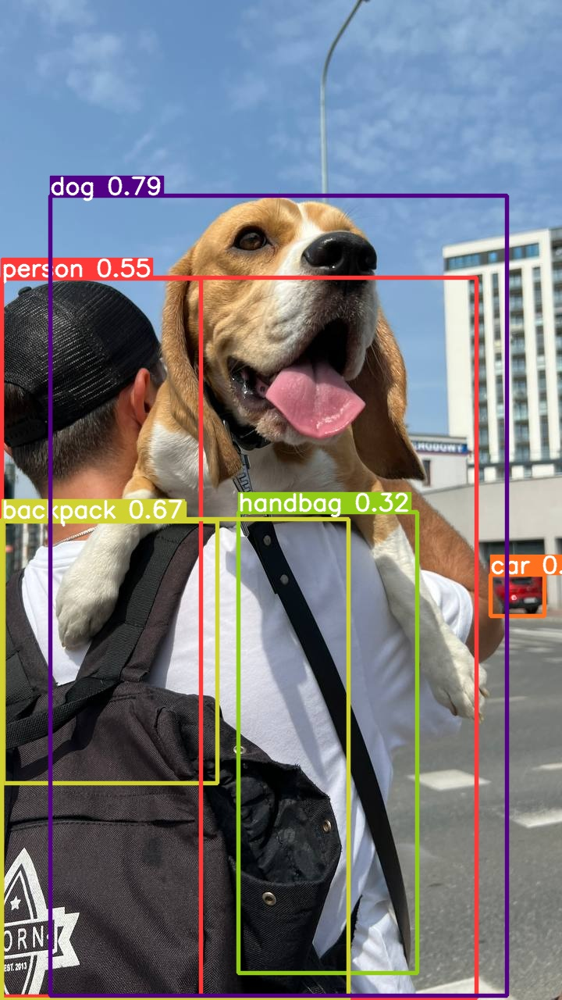

In [19]:
from IPython.display import Image

Image(filename=f"{HOME}/yolov9/runs/detect/exp3/dog.jpeg", width=600)

## yolov9-e

In [11]:
!python detect.py --weights {HOME}/weights/yolov9-e.pt --conf 0.1 --source {HOME}/data/dog.jpeg --device 0

detect: weights=['/content/weights/yolov9-e.pt'], source=/content/data/dog.jpeg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=0, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 1e33dbb Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 1119 layers, 69470144 parameters, 0 gradients, 244.0 GFLOPs
image 1/1 /content/data/dog.jpeg: 640x384 1 person, 1 car, 1 dog, 1 backpack, 1 handbag, 160.2ms
Speed: 0.4ms pre-process, 160.2ms inference, 504.6ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp2


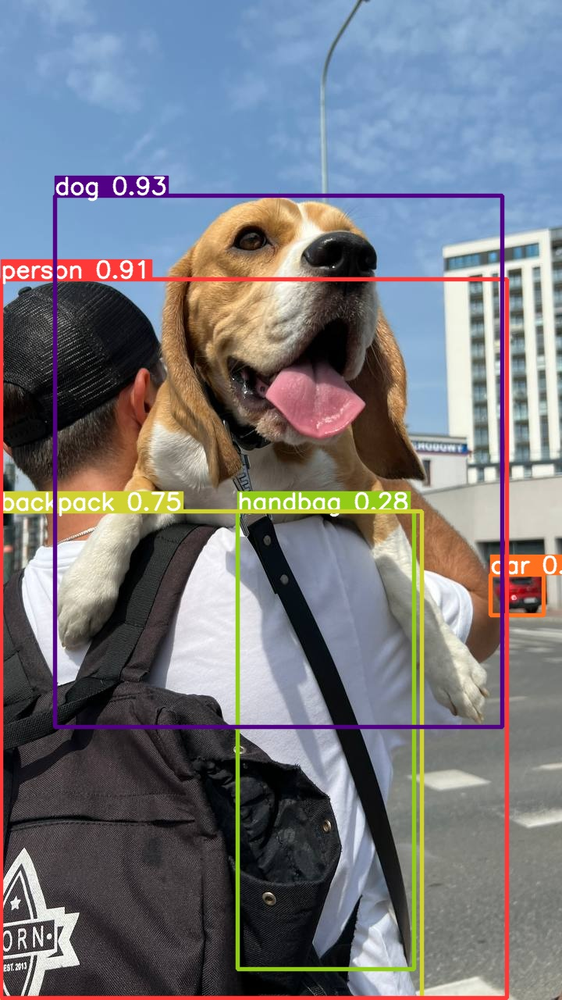

In [12]:
from IPython.display import Image

Image(filename=f"{HOME}/yolov9/runs/detect/exp2/dog.jpeg", width=600)

## Authenticate and Download the Dataset

In [9]:
from roboflow import Roboflow
rf = Roboflow(api_key="eSzt9jqUwL3SzdHp0dmr")
project = rf.workspace("ahmed-stohy").project("kitti-eux6l")
version = project.version(3)
dataset = version.download("yolov9")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to KITTI-3 in yolov9:: 100%|██████████████████████████████████| 14974/14974 [00:10<00:00, 1368.36it/s]


## Train Custom Model

In [13]:
!pip install ultralytics

  Using cached opencv_python-4.10.0.84-cp37-abi3-win_amd64.whl (38.8 MB)
  Using cached py_cpuinfo-9.0.0-py3-none-any.whl (22 kB)


ERROR: Could not install packages due to an OSError: [WinError 5] Access is denied: 'D:\\Viren\\AIKD\\Pedestian\\vr\\Lib\\site-packages\\cv2\\cv2.pyd'
Check the permissions.

You should consider upgrading via the 'D:\Viren\AIKD\Pedestian\vr\Scripts\python.exe -m pip install --upgrade pip' command.


In [3]:
ls

 Volume in drive D has no label.
 Volume Serial Number is 62E5-E029

 Directory of D:\Viren\AIKD\Pedestian

20-07-2024  21:59    <DIR>          .
20-07-2024  21:59    <DIR>          ..
20-07-2024  21:06    <DIR>          .ipynb_checkpoints
20-07-2024  21:59         4,201,389 Copy_of_train_yolov9_object_detection_on_custom_dataset.ipynb
19-07-2024  17:50    <DIR>          datasets
20-07-2024  21:25    <DIR>          KITTI-3
19-07-2024  17:44    <DIR>          rgbt-ped-detection
20-07-2024  21:07    <DIR>          vr
20-07-2024  21:05    <DIR>          yolov9
20-07-2024  21:08        66,462,416 yolov9-m.pt
20-07-2024  21:21         4,969,803 yolov9t.pt
               3 File(s)     75,633,608 bytes
               8 Dir(s)  625,803,976,704 bytes free


In [8]:
from ultralytics import YOLO

# Build a YOLOv9c model from scratch
model = YOLO("yolov9m.yaml")

# # Build a YOLOv9c model from pretrained weight
# model = YOLO("yolov9m.pt")

# Display model information (optional)
# model.info()

# Train the model on the COCO8 example dataset for 100 epochs
# results = model.train(data={dataset.location}/data.yaml, epochs=100, imgsz=640)

#### Added Extra Layers to the Model

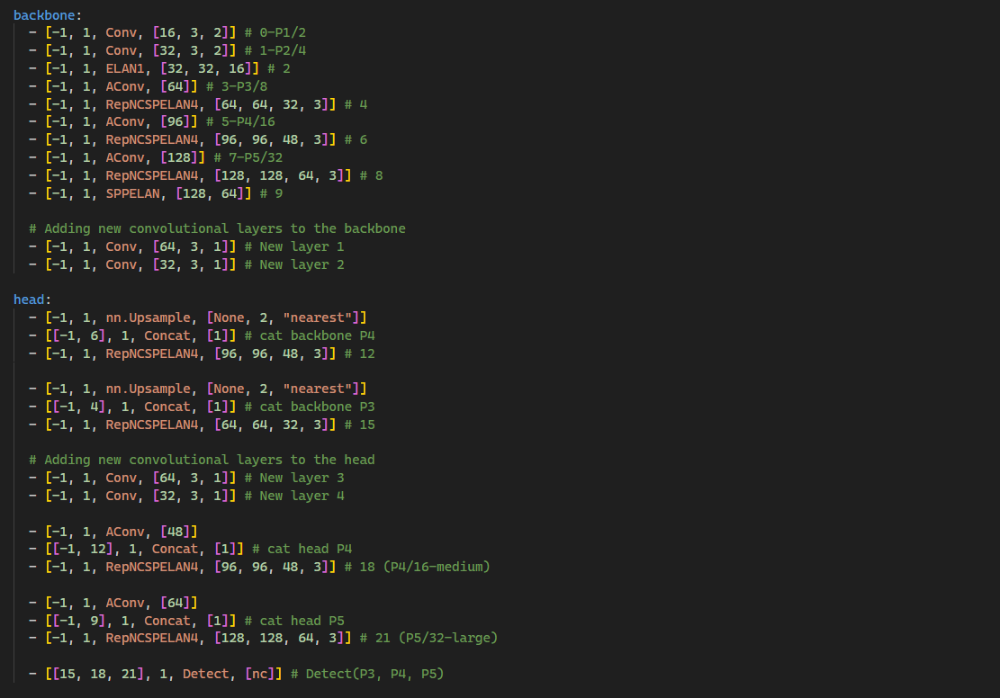

In [9]:
print(model)

YOLO(
  (model): DetectionModel(
    (model): Sequential(
      (0): Conv(
        (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (1): Conv(
        (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(64, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (2): RepNCSPELAN4(
        (cv1): Conv(
          (conv): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(128, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
          (act): SiLU(inplace=True)
        )
        (cv2): Sequential(
          (0): RepCSP(
            (cv1): Conv(
              (conv): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
              (bn

In [10]:
# !yolo train model=yolov9.yaml data=coco8.yaml epochs=100 imgsz=640

In [12]:
# CUDA_LAUNCH_BLOCKING=1
results = model.train(data="D:\Viren\AIKD\Pedestian\KITTI-3\data.yaml", epochs=200, imgsz=128,batch=32,workers=176)

New https://pypi.org/project/ultralytics/8.2.65 available  Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.2.61  Python-3.10.0 torch-2.3.1+cu121 CUDA:0 (NVIDIA GeForce GTX 1060, 6144MiB)
engine\trainer: task=detect, mode=train, model=yolov9m.yaml, data=D:\Viren\AIKD\Pedestian\KITTI-3\data.yaml, epochs=200, time=None, patience=100, batch=32, imgsz=128, save=True, save_period=-1, cache=False, device=None, workers=176, project=None, name=train21, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False

train: Scanning D:\Viren\AIKD\Pedestian\KITTI-3\train\labels.cache... 5237 images, 0 backgrounds, 0 corrupt: 100%|██████████| 5237/5237 [00:00<?
val: Scanning D:\Viren\AIKD\Pedestian\KITTI-3\valid\labels.cache... 1496 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1496/1496 [00:00<?, 


Plotting labels to runs\detect\train21\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 153 weight(decay=0.0), 160 weight(decay=0.0005), 159 bias(decay=0.0)
Image sizes 128 train, 128 val
Using 4 dataloader workers
Logging results to runs\detect\train21
Starting training for 200 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/200      2.63G      6.341      4.461      4.085        145        128: 100%|██████████| 164/164 [00:59<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:10<00:00,  2.35it/s]

                   all       1496       8040    0.00132     0.0204   0.000755    0.00029



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/200      2.75G      4.037      2.538      2.475        153        128: 100%|██████████| 164/164 [00:52<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:10<00:00,  2.23it/s]


                   all       1496       8040      0.736     0.0518     0.0301     0.0103

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/200      2.76G      2.897      1.791      1.576        116        128: 100%|██████████| 164/164 [00:55<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.08it/s]

                   all       1496       8040      0.804     0.0889     0.0854     0.0339



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/200      2.76G      2.504      1.586      1.357        192        128: 100%|██████████| 164/164 [00:54<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.06it/s]


                   all       1496       8040      0.479      0.121        0.1     0.0418

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/200      2.77G       2.27      1.427      1.239        120        128: 100%|██████████| 164/164 [00:51<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:12<00:00,  1.97it/s]


                   all       1496       8040      0.605      0.153      0.148      0.064

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/200      2.77G      2.134      1.342      1.201        147        128: 100%|██████████| 164/164 [00:50<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:10<00:00,  2.25it/s]

                   all       1496       8040       0.57       0.17      0.163     0.0753



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/200      2.76G      2.027      1.276      1.163        156        128: 100%|██████████| 164/164 [00:49<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.16it/s]

                   all       1496       8040      0.581      0.203      0.188     0.0897



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/200      2.75G      1.958      1.228      1.146        146        128: 100%|██████████| 164/164 [00:50<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.13it/s]

                   all       1496       8040      0.562      0.201      0.183     0.0882



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/200      2.76G      1.899      1.197      1.135        133        128: 100%|██████████| 164/164 [00:53<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.00it/s]

                   all       1496       8040      0.591      0.205      0.199     0.0978



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/200      2.75G      1.844      1.155      1.118        154        128: 100%|██████████| 164/164 [00:53<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:12<00:00,  1.97it/s]


                   all       1496       8040      0.662      0.218      0.229      0.114

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/200      2.76G      1.794      1.117      1.099        143        128: 100%|██████████| 164/164 [00:57<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:12<00:00,  1.96it/s]

                   all       1496       8040      0.291      0.241      0.225      0.115



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/200      2.76G      1.767      1.093      1.099        148        128: 100%|██████████| 164/164 [00:57<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:12<00:00,  1.92it/s]

                   all       1496       8040      0.297      0.225      0.228      0.115



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/200      2.75G      1.736      1.084      1.082        131        128: 100%|██████████| 164/164 [00:55<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:14<00:00,  1.64it/s]

                   all       1496       8040      0.654      0.231      0.248      0.125



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/200      2.75G      1.712      1.065      1.078        173        128: 100%|██████████| 164/164 [00:58<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:13<00:00,  1.75it/s]

                   all       1496       8040      0.683      0.231      0.252      0.129



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/200      2.75G      1.668      1.034      1.061        120        128: 100%|██████████| 164/164 [00:56<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:14<00:00,  1.70it/s]

                   all       1496       8040      0.668      0.235      0.254      0.132



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/200      2.76G      1.643      1.016      1.058        147        128: 100%|██████████| 164/164 [01:05<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:14<00:00,  1.64it/s]

                   all       1496       8040      0.538      0.244      0.272      0.141



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/200      2.75G      1.631      1.012      1.056        200        128: 100%|██████████| 164/164 [01:10<00:00,  2.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:15<00:00,  1.52it/s]

                   all       1496       8040      0.391      0.248      0.267      0.138



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/200      2.77G      1.603     0.9929       1.05        149        128: 100%|██████████| 164/164 [01:21<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:19<00:00,  1.26it/s]

                   all       1496       8040      0.584      0.255      0.277      0.141



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/200      2.75G      1.573     0.9719       1.04        139        128: 100%|██████████| 164/164 [01:04<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:14<00:00,  1.70it/s]

                   all       1496       8040      0.535      0.242      0.271      0.145



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/200      2.76G      1.574     0.9676      1.041        215        128: 100%|██████████| 164/164 [00:55<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.01it/s]

                   all       1496       8040      0.582      0.259      0.286      0.147



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/200      2.76G      1.557     0.9601      1.033        189        128: 100%|██████████| 164/164 [00:57<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:12<00:00,  1.89it/s]

                   all       1496       8040       0.46      0.273      0.282       0.15



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/200      2.76G      1.523     0.9351      1.026        151        128: 100%|██████████| 164/164 [00:52<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:12<00:00,  1.92it/s]

                   all       1496       8040      0.357      0.295      0.283       0.15



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/200      2.75G       1.51     0.9314      1.026        202        128: 100%|██████████| 164/164 [00:57<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:14<00:00,  1.63it/s]

                   all       1496       8040      0.383      0.301      0.293      0.157



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/200      2.75G      1.515     0.9284      1.024        113        128: 100%|██████████| 164/164 [00:56<00:00,  2.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:14<00:00,  1.63it/s]

                   all       1496       8040      0.733       0.26      0.296      0.158



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/200      2.75G      1.502     0.9242      1.023        149        128: 100%|██████████| 164/164 [01:19<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:14<00:00,  1.71it/s]

                   all       1496       8040      0.456      0.294      0.302      0.162



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/200      2.75G      1.466     0.8942      1.008        137        128: 100%|██████████| 164/164 [01:02<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:13<00:00,  1.78it/s]

                   all       1496       8040      0.498      0.294      0.309      0.164



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/200      2.75G      1.469     0.9014       1.01        127        128: 100%|██████████| 164/164 [01:00<00:00,  2.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:14<00:00,  1.63it/s]

                   all       1496       8040       0.42      0.299        0.3      0.163



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/200      2.75G      1.458     0.8921      1.007        164        128: 100%|██████████| 164/164 [01:01<00:00,  2.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:14<00:00,  1.71it/s]

                   all       1496       8040      0.443      0.297      0.307      0.169



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/200      2.75G      1.466     0.9015      1.012        168        128: 100%|██████████| 164/164 [00:54<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:12<00:00,  1.98it/s]

                   all       1496       8040      0.487      0.306       0.31      0.167



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/200      2.77G      1.422     0.8747      1.004        123        128: 100%|██████████| 164/164 [00:54<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.00it/s]

                   all       1496       8040      0.477      0.305      0.315      0.174



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/200      2.77G      1.414     0.8589     0.9989        144        128: 100%|██████████| 164/164 [00:55<00:00,  2.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:12<00:00,  1.97it/s]

                   all       1496       8040      0.473      0.298      0.312      0.172



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/200      2.77G      1.414     0.8593     0.9972        166        128: 100%|██████████| 164/164 [00:59<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:12<00:00,  1.85it/s]

                   all       1496       8040      0.545      0.291      0.323      0.178



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/200      2.75G      1.401     0.8512     0.9941        147        128: 100%|██████████| 164/164 [00:59<00:00,  2.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:15<00:00,  1.58it/s]

                   all       1496       8040      0.431      0.326      0.322      0.179



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/200      2.75G        1.4     0.8498     0.9942        135        128: 100%|██████████| 164/164 [01:00<00:00,  2.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:14<00:00,  1.69it/s]

                   all       1496       8040      0.399      0.329      0.315      0.171



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/200      2.77G      1.388     0.8499     0.9931        109        128: 100%|██████████| 164/164 [01:03<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:14<00:00,  1.63it/s]

                   all       1496       8040      0.488      0.325      0.335      0.182



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/200      2.75G      1.392     0.8446     0.9918        167        128: 100%|██████████| 164/164 [01:00<00:00,  2.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:14<00:00,  1.69it/s]

                   all       1496       8040       0.59      0.303      0.333      0.183



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/200      2.75G      1.371     0.8323     0.9918        163        128: 100%|██████████| 164/164 [01:02<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:13<00:00,  1.73it/s]

                   all       1496       8040        0.5      0.322      0.339      0.191



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/200      2.75G      1.381     0.8368     0.9889        170        128: 100%|██████████| 164/164 [01:01<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:14<00:00,  1.65it/s]

                   all       1496       8040      0.494       0.31      0.328      0.183



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/200      2.77G      1.366     0.8245      0.986        132        128: 100%|██████████| 164/164 [00:55<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.00it/s]

                   all       1496       8040       0.52      0.321      0.339      0.191



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/200      2.77G      1.351     0.8258     0.9807        172        128: 100%|██████████| 164/164 [00:54<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:12<00:00,  1.99it/s]

                   all       1496       8040      0.511      0.344      0.354      0.195



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/200      2.75G      1.348     0.8146     0.9789        126        128: 100%|██████████| 164/164 [00:53<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:13<00:00,  1.72it/s]

                   all       1496       8040      0.576      0.296      0.336      0.188



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/200      2.75G      1.344     0.8106      0.984        123        128: 100%|██████████| 164/164 [00:53<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.04it/s]

                   all       1496       8040       0.49      0.351      0.354      0.195



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/200      2.75G      1.333     0.8087     0.9748        147        128: 100%|██████████| 164/164 [00:56<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:12<00:00,  1.98it/s]

                   all       1496       8040      0.499      0.327      0.346      0.189



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/200      2.75G      1.327     0.8082     0.9782        117        128: 100%|██████████| 164/164 [00:55<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.06it/s]

                   all       1496       8040      0.463      0.355      0.354      0.196



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/200      2.75G      1.334     0.8085     0.9767        116        128: 100%|██████████| 164/164 [00:52<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.04it/s]

                   all       1496       8040      0.482      0.334      0.351      0.195



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/200      2.75G       1.31     0.7892     0.9709        202        128: 100%|██████████| 164/164 [00:52<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:12<00:00,  1.97it/s]

                   all       1496       8040      0.574       0.33      0.359      0.198



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/200      2.77G      1.319     0.7955     0.9747        134        128: 100%|██████████| 164/164 [00:52<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.05it/s]

                   all       1496       8040      0.544      0.335       0.36      0.201



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/200      2.77G       1.31     0.7942     0.9719        180        128: 100%|██████████| 164/164 [00:52<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:12<00:00,  1.99it/s]

                   all       1496       8040      0.588      0.334      0.362      0.199



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/200      2.75G      1.309     0.7877     0.9746        127        128: 100%|██████████| 164/164 [00:52<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:12<00:00,  1.94it/s]

                   all       1496       8040      0.508      0.354       0.37      0.209



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/200      2.74G      1.307     0.7834     0.9717        168        128: 100%|██████████| 164/164 [00:52<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.07it/s]

                   all       1496       8040      0.576      0.324      0.361      0.205



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/200      2.75G      1.298     0.7884     0.9709        131        128: 100%|██████████| 164/164 [00:52<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:12<00:00,  1.95it/s]

                   all       1496       8040      0.561      0.332      0.363      0.202



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/200      2.77G      1.291     0.7765     0.9701        166        128: 100%|██████████| 164/164 [00:52<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:13<00:00,  1.79it/s]

                   all       1496       8040      0.544      0.326      0.357        0.2



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/200      2.76G       1.29     0.7767      0.968        131        128: 100%|██████████| 164/164 [00:53<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.01it/s]

                   all       1496       8040      0.575      0.352      0.378      0.211



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/200      2.77G      1.282     0.7726     0.9643        240        128: 100%|██████████| 164/164 [00:53<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.09it/s]

                   all       1496       8040      0.578      0.349      0.374       0.21



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/200      2.77G       1.27      0.756     0.9611        145        128: 100%|██████████| 164/164 [00:52<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.05it/s]

                   all       1496       8040      0.591      0.339      0.373      0.211



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/200      2.75G      1.278     0.7634     0.9668        176        128: 100%|██████████| 164/164 [00:52<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.03it/s]

                   all       1496       8040      0.551      0.357      0.379      0.214



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/200      2.77G      1.265     0.7549     0.9605        112        128: 100%|██████████| 164/164 [00:54<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.10it/s]

                   all       1496       8040      0.563      0.354      0.377      0.213



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/200      2.75G      1.256     0.7549     0.9606        143        128: 100%|██████████| 164/164 [00:53<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.04it/s]

                   all       1496       8040       0.53      0.366       0.38      0.213



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/200      2.75G      1.262     0.7566     0.9621        122        128: 100%|██████████| 164/164 [00:53<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.04it/s]

                   all       1496       8040       0.56      0.353      0.377      0.217



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/200      2.75G      1.253      0.754     0.9611        260        128: 100%|██████████| 164/164 [00:52<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:13<00:00,  1.82it/s]

                   all       1496       8040      0.549       0.37      0.394      0.219



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/200      2.76G      1.242     0.7433     0.9581        180        128: 100%|██████████| 164/164 [00:52<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.11it/s]

                   all       1496       8040      0.536      0.374      0.392      0.221



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/200      2.75G       1.24     0.7436     0.9598        129        128: 100%|██████████| 164/164 [00:52<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.07it/s]

                   all       1496       8040      0.608      0.356      0.393      0.224



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/200      2.76G      1.244     0.7402     0.9586        190        128: 100%|██████████| 164/164 [00:52<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.11it/s]

                   all       1496       8040      0.572      0.366      0.397      0.222



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/200      2.74G      1.229     0.7371     0.9522        140        128: 100%|██████████| 164/164 [00:55<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.03it/s]

                   all       1496       8040      0.637      0.362      0.402      0.229



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/200      2.75G      1.225     0.7384     0.9518        114        128: 100%|██████████| 164/164 [00:53<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.07it/s]

                   all       1496       8040      0.547      0.376      0.389      0.224



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/200      2.74G      1.241     0.7444     0.9563        161        128: 100%|██████████| 164/164 [00:52<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:12<00:00,  1.99it/s]

                   all       1496       8040      0.614      0.362      0.397      0.225



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/200      2.74G      1.227     0.7312     0.9514        164        128: 100%|██████████| 164/164 [00:52<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.01it/s]

                   all       1496       8040      0.641      0.356      0.396      0.227



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/200      2.77G      1.229     0.7287     0.9531        157        128: 100%|██████████| 164/164 [00:53<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:12<00:00,  1.92it/s]

                   all       1496       8040      0.649      0.361      0.404      0.231



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/200      2.76G      1.226     0.7295     0.9511        143        128: 100%|██████████| 164/164 [00:52<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.03it/s]

                   all       1496       8040      0.595      0.366        0.4      0.229



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/200      2.76G      1.224     0.7281      0.952        156        128: 100%|██████████| 164/164 [00:52<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:12<00:00,  1.98it/s]

                   all       1496       8040      0.581      0.376      0.398      0.229



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/200      2.75G      1.213     0.7223     0.9495        116        128: 100%|██████████| 164/164 [00:52<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:12<00:00,  1.99it/s]

                   all       1496       8040      0.595      0.391      0.412      0.238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/200      2.74G      1.212      0.726     0.9511        133        128: 100%|██████████| 164/164 [00:53<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:12<00:00,  2.00it/s]

                   all       1496       8040      0.607      0.368      0.402      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/200      2.76G      1.201     0.7211     0.9466        129        128: 100%|██████████| 164/164 [00:53<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.00it/s]

                   all       1496       8040      0.654      0.368      0.415      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/200      2.75G       1.22     0.7307     0.9512        173        128: 100%|██████████| 164/164 [00:53<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.02it/s]

                   all       1496       8040        0.6      0.377      0.407      0.235



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/200      2.75G       1.19     0.7129     0.9444        155        128: 100%|██████████| 164/164 [00:55<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:12<00:00,  1.97it/s]

                   all       1496       8040      0.596       0.38      0.412      0.238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/200      2.74G       1.19     0.7069     0.9433        182        128: 100%|██████████| 164/164 [00:56<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:12<00:00,  1.91it/s]

                   all       1496       8040      0.652      0.371      0.418      0.241



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/200      2.76G      1.184     0.7078     0.9428        193        128: 100%|██████████| 164/164 [00:58<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:14<00:00,  1.70it/s]

                   all       1496       8040       0.63      0.377      0.417       0.24



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/200      2.75G      1.181     0.7062     0.9416        157        128: 100%|██████████| 164/164 [00:59<00:00,  2.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:14<00:00,  1.63it/s]

                   all       1496       8040      0.612      0.391      0.423      0.245



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/200      2.74G      1.179     0.6986     0.9417        152        128: 100%|██████████| 164/164 [01:00<00:00,  2.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:14<00:00,  1.67it/s]

                   all       1496       8040      0.614      0.385       0.42      0.246



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/200      2.74G      1.193     0.7064     0.9421        150        128: 100%|██████████| 164/164 [00:59<00:00,  2.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:13<00:00,  1.73it/s]

                   all       1496       8040      0.619      0.385      0.416      0.242



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/200      2.74G       1.17     0.6961     0.9414        165        128: 100%|██████████| 164/164 [00:54<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:12<00:00,  2.00it/s]

                   all       1496       8040       0.63       0.39      0.429      0.248



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/200      2.74G      1.179      0.698     0.9448        156        128: 100%|██████████| 164/164 [00:53<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:12<00:00,  1.99it/s]

                   all       1496       8040      0.636       0.38      0.426      0.247



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/200      2.74G      1.164     0.6952     0.9409        117        128: 100%|██████████| 164/164 [00:53<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:12<00:00,  1.99it/s]

                   all       1496       8040      0.646      0.375      0.421      0.248



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/200      2.76G      1.159     0.6889      0.937        171        128: 100%|██████████| 164/164 [00:52<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.01it/s]

                   all       1496       8040      0.632      0.396      0.424      0.247



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/200      2.76G      1.151     0.6859     0.9373        149        128: 100%|██████████| 164/164 [00:54<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.00it/s]

                   all       1496       8040      0.641      0.387      0.429      0.246



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/200      2.74G      1.172     0.6907     0.9355        207        128:   5%|▌         | 9/164 [00:03<00:49,  3.14it/s]IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

    125/200      2.74G      1.066     0.6266     0.9181        150        128: 100%|██████████| 164/164 [00:53<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.03it/s]

                   all       1496       8040      0.682       0.42      0.465      0.281



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/200      2.74G      1.069     0.6328     0.9153        163        128: 100%|██████████| 164/164 [00:51<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.04it/s]

                   all       1496       8040       0.65      0.436      0.464       0.28



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/200      2.74G      1.055     0.6202     0.9139        182        128: 100%|██████████| 164/164 [00:53<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.06it/s]

                   all       1496       8040      0.666      0.425      0.463      0.278



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/200      2.76G       1.07      0.631     0.9205        137        128: 100%|██████████| 164/164 [00:52<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.02it/s]

                   all       1496       8040      0.633      0.427      0.461      0.279



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/200      2.76G      1.061     0.6286     0.9153        122        128: 100%|██████████| 164/164 [00:53<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.08it/s]

                   all       1496       8040      0.652      0.421      0.463       0.28



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/200      2.76G      1.061     0.6235     0.9145        153        128: 100%|██████████| 164/164 [00:52<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.03it/s]

                   all       1496       8040      0.651      0.426      0.466      0.283



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    131/200      2.76G      1.062     0.6284     0.9213        111        128: 100%|██████████| 164/164 [00:52<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.03it/s]

                   all       1496       8040      0.636      0.424      0.463      0.282



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    132/200      2.74G       1.05     0.6173     0.9176        164        128: 100%|██████████| 164/164 [00:52<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.04it/s]

                   all       1496       8040      0.651      0.424      0.464      0.282



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    133/200      2.76G      1.047     0.6197      0.914        205        128: 100%|██████████| 164/164 [00:53<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:12<00:00,  1.99it/s]

                   all       1496       8040      0.648      0.424      0.466      0.282



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    134/200      2.75G      1.043     0.6114     0.9095        270        128:  18%|█▊        | 29/164 [00:09<00:42,  3.18it/s]IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

    167/200      2.76G     0.9786     0.5739     0.8979        177        128: 100%|██████████| 164/164 [00:58<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:14<00:00,  1.64it/s]

                   all       1496       8040      0.723       0.43      0.487      0.296



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    168/200      2.76G     0.9793     0.5764        0.9        189        128: 100%|██████████| 164/164 [00:53<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.03it/s]

                   all       1496       8040      0.723       0.43      0.487      0.297



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    169/200      2.76G     0.9704     0.5648     0.8972        178        128: 100%|██████████| 164/164 [00:54<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:12<00:00,  1.88it/s]

                   all       1496       8040      0.717      0.432      0.488      0.298



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    170/200      2.74G     0.9676     0.5652     0.8973        146        128: 100%|██████████| 164/164 [00:52<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.03it/s]

                   all       1496       8040      0.719      0.436      0.488      0.297



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    171/200      2.76G     0.9631     0.5668     0.8948        190        128: 100%|██████████| 164/164 [00:53<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.02it/s]

                   all       1496       8040      0.707      0.436      0.487      0.298



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    172/200      2.75G     0.9667     0.5661     0.8959        182        128: 100%|██████████| 164/164 [00:53<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.08it/s]

                   all       1496       8040      0.712      0.434      0.487      0.298



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    173/200      2.74G     0.9646      0.567     0.8931         99        128: 100%|██████████| 164/164 [00:53<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.04it/s]

                   all       1496       8040       0.71      0.436      0.489      0.298



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    174/200      2.74G     0.9534     0.5654     0.8946        135        128: 100%|██████████| 164/164 [00:57<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.06it/s]

                   all       1496       8040      0.705      0.437      0.489      0.298



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    175/200      2.76G     0.9605     0.5611     0.8936        132        128: 100%|██████████| 164/164 [00:51<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:12<00:00,  1.97it/s]

                   all       1496       8040       0.71      0.436      0.488      0.298



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    176/200      2.74G     0.9648     0.5633     0.8943        238        128: 100%|██████████| 164/164 [00:59<00:00,  2.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:13<00:00,  1.83it/s]

                   all       1496       8040      0.711      0.435      0.487      0.298



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    177/200      2.76G     0.9619      0.565     0.8944        156        128: 100%|██████████| 164/164 [00:56<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:15<00:00,  1.55it/s]

                   all       1496       8040      0.711      0.435      0.489      0.298



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    178/200      2.74G     0.9445     0.5492     0.8891        119        128: 100%|██████████| 164/164 [00:56<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:13<00:00,  1.84it/s]

                   all       1496       8040      0.712      0.439      0.489      0.299



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    179/200      2.74G     0.9449     0.5545     0.8957        207        128: 100%|██████████| 164/164 [00:59<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:12<00:00,  1.91it/s]

                   all       1496       8040      0.707       0.44      0.489      0.299



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    180/200      2.74G     0.9525     0.5601     0.8944        157        128: 100%|██████████| 164/164 [00:55<00:00,  2.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:12<00:00,  1.98it/s]

                   all       1496       8040      0.707       0.44       0.49      0.299



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    181/200      2.74G     0.9507     0.5546     0.8934        140        128: 100%|██████████| 164/164 [00:52<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:12<00:00,  1.94it/s]

                   all       1496       8040      0.704      0.437       0.49      0.299



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    182/200      2.76G      0.942     0.5506     0.8918        184        128: 100%|██████████| 164/164 [00:53<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:12<00:00,  2.00it/s]

                   all       1496       8040      0.703      0.437       0.49        0.3



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    183/200      2.76G      0.947     0.5541     0.8944        183        128: 100%|██████████| 164/164 [00:54<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:12<00:00,  1.99it/s]

                   all       1496       8040      0.702      0.439      0.491        0.3



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    184/200      2.76G     0.9389     0.5477     0.8923         97        128: 100%|██████████| 164/164 [00:54<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.07it/s]

                   all       1496       8040      0.702      0.443       0.49        0.3



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    185/200      2.74G     0.9327     0.5473     0.8906        171        128: 100%|██████████| 164/164 [00:53<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:13<00:00,  1.73it/s]

                   all       1496       8040      0.703      0.441      0.491        0.3



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    186/200      2.74G     0.9387     0.5492     0.8897        142        128: 100%|██████████| 164/164 [00:53<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:12<00:00,  1.97it/s]

                   all       1496       8040      0.707      0.437      0.492        0.3



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    187/200      2.76G     0.9366     0.5484     0.8928        150        128: 100%|██████████| 164/164 [00:54<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:13<00:00,  1.76it/s]

                   all       1496       8040      0.709      0.437      0.491        0.3



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    188/200      2.75G     0.9352     0.5484     0.8871        122        128: 100%|██████████| 164/164 [00:55<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:12<00:00,  1.86it/s]

                   all       1496       8040      0.711      0.436       0.49      0.301



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    189/200      2.74G     0.9269      0.543     0.8895        142        128: 100%|██████████| 164/164 [00:56<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:14<00:00,  1.66it/s]

                   all       1496       8040      0.705      0.438      0.491      0.301



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    190/200      2.74G     0.9389     0.5491     0.8927        170        128: 100%|██████████| 164/164 [00:53<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:12<00:00,  1.96it/s]

                   all       1496       8040       0.71      0.438      0.492      0.301


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    191/200      2.76G      0.889     0.5084     0.8748        110        128: 100%|██████████| 164/164 [00:52<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:12<00:00,  1.97it/s]

                   all       1496       8040      0.712      0.435      0.491      0.301



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    192/200      2.76G     0.8795     0.5027      0.874         87        128: 100%|██████████| 164/164 [00:54<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.02it/s]

                   all       1496       8040      0.713      0.435      0.492      0.301



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    193/200      2.75G     0.8741     0.4982     0.8727         95        128: 100%|██████████| 164/164 [00:52<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:12<00:00,  1.89it/s]

                   all       1496       8040      0.715      0.437      0.493      0.301



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    194/200      2.74G     0.8665     0.4947     0.8704         97        128: 100%|██████████| 164/164 [00:54<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.00it/s]

                   all       1496       8040      0.703       0.44      0.493      0.301



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    195/200      2.74G     0.8628     0.4938     0.8703        103        128: 100%|██████████| 164/164 [00:54<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.03it/s]

                   all       1496       8040      0.701      0.442      0.494      0.301



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    196/200      2.74G     0.8572       0.49     0.8695         84        128: 100%|██████████| 164/164 [00:52<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.02it/s]

                   all       1496       8040      0.697      0.443      0.494      0.301



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    197/200      2.74G     0.8582     0.4907     0.8677         87        128: 100%|██████████| 164/164 [00:52<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:11<00:00,  2.10it/s]

                   all       1496       8040      0.695      0.443      0.494      0.301



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    198/200      2.74G     0.8507     0.4882     0.8667        114        128: 100%|██████████| 164/164 [00:54<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:12<00:00,  1.87it/s]

                   all       1496       8040      0.689      0.445      0.492      0.301



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    199/200      2.76G     0.8532     0.4855     0.8704        132        128: 100%|██████████| 164/164 [00:54<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:12<00:00,  1.95it/s]

                   all       1496       8040      0.695      0.443      0.492      0.302



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    200/200      2.76G     0.8508     0.4886     0.8662         85        128: 100%|██████████| 164/164 [00:57<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:12<00:00,  1.91it/s]

                   all       1496       8040      0.691      0.445      0.492      0.302



200 epochs completed in 3.888 hours.
Optimizer stripped from runs\detect\train21\weights\last.pt, 43.9MB
Optimizer stripped from runs\detect\train21\weights\best.pt, 43.9MB

Validating runs\detect\train21\weights\best.pt...
Ultralytics YOLOv8.2.61  Python-3.10.0 torch-2.3.1+cu121 CUDA:0 (NVIDIA GeForce GTX 1060, 6144MiB)
YOLOv9m summary (fused): 382 layers, 21,539,305 parameters, 0 gradients, 115.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:14<00:00,  1.65it/s]


                   all       1496       8040      0.682       0.45      0.493      0.302
                   Car       1368       6830      0.794      0.694      0.757       0.54
               Cyclist        235        332      0.644      0.298      0.335      0.167
            Pedestrian        355        878      0.607      0.356      0.385      0.199
Speed: 0.1ms preprocess, 2.7ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to runs\detect\train21


In [ ]:
# %cd {HOME}/yolov9

# !python train.py \
# --batch 16 --epochs 75 --img 125 --device 0 --min-items 0 --close-mosaic 15 \
# --data {dataset.location}/data.yaml \
# --weights {HOME}/weights/yolov9-m.pt \
# --cfg models/detect/yolov9-c.yaml \
# --hyp hyp.scratch-high.yaml

In [ ]:
print("hellllo")

## Examine Training Results

**NOTE:** By default, the results of each subsequent training sessions are saved in `{HOME}/yolov9/runs/train/`, in directories named `exp`, `exp2`, `exp3`, ... You can override this behavior by using the `--name` parameter.

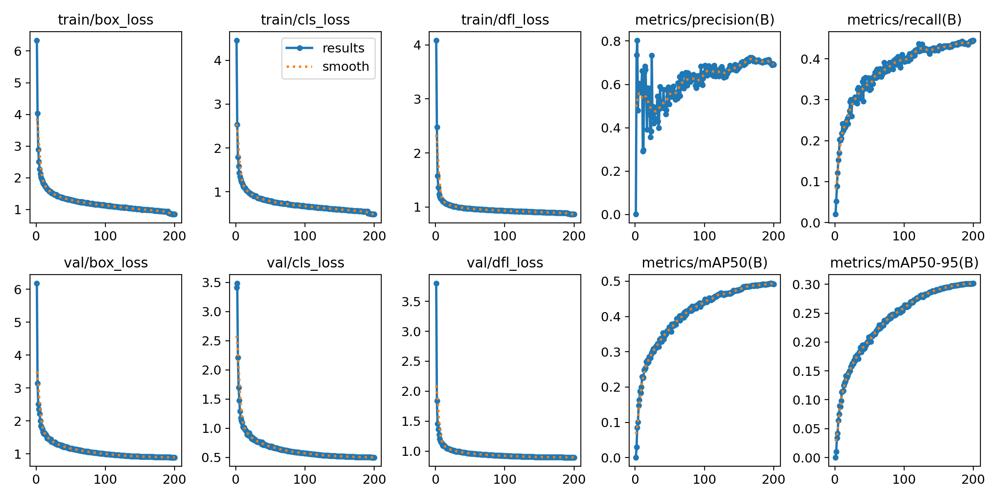

In [1]:
from IPython.display import Image

Image(filename=f"runs/detect/train21/results.png", width=1000)

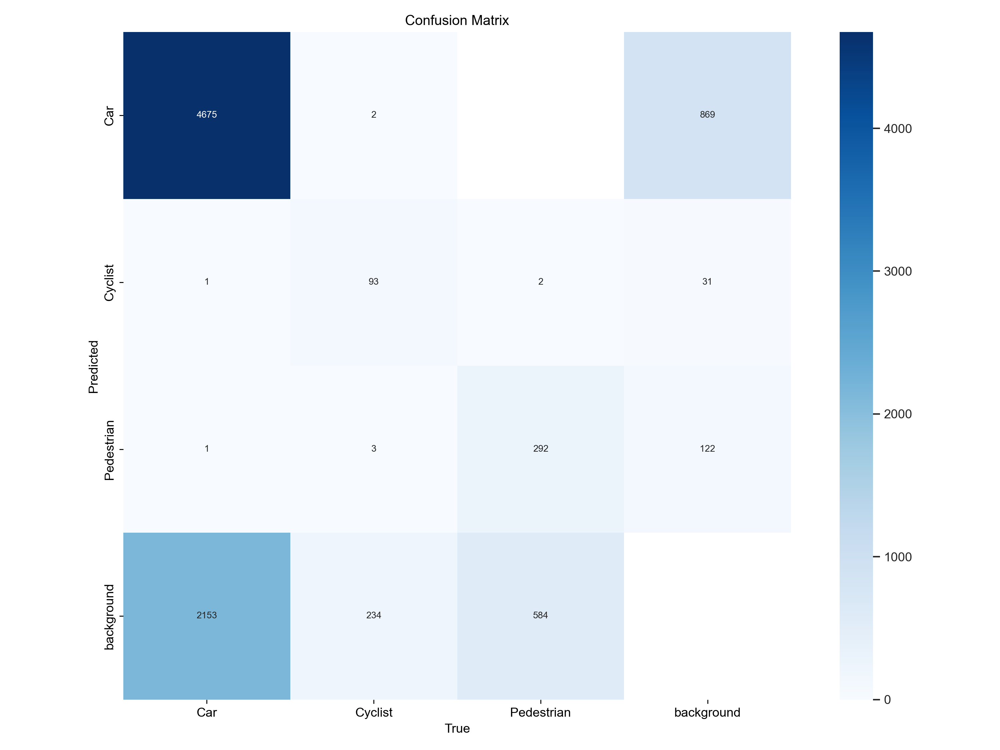

In [2]:
from IPython.display import Image

Image(filename=f"runs/detect/train21/confusion_matrix.png", width=1000)

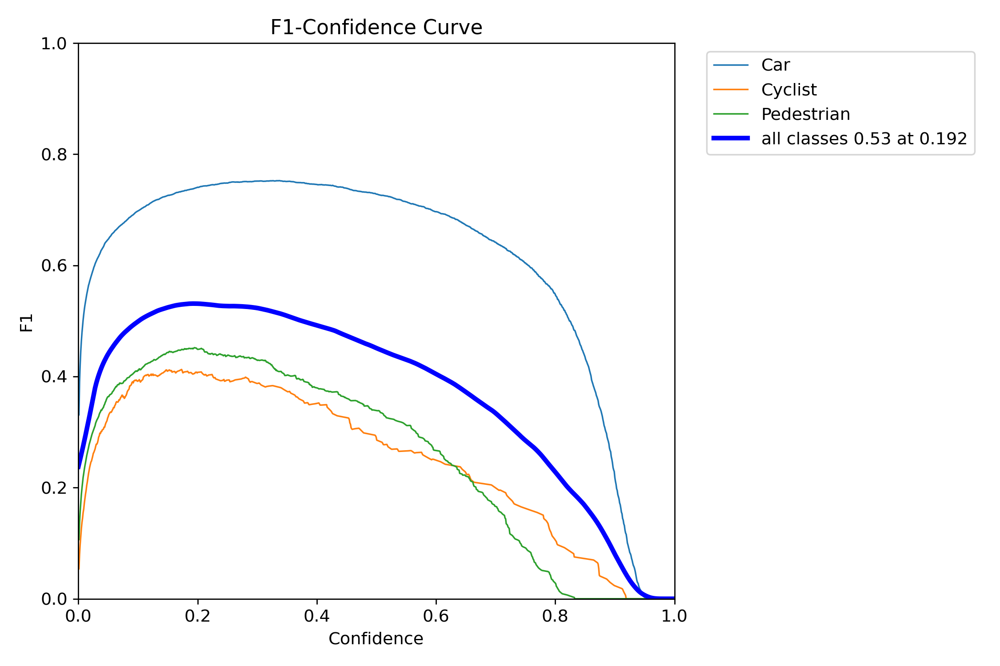

In [3]:
from IPython.display import Image

Image(filename=f"runs/detect/train21/F1_curve.png", width=1000)

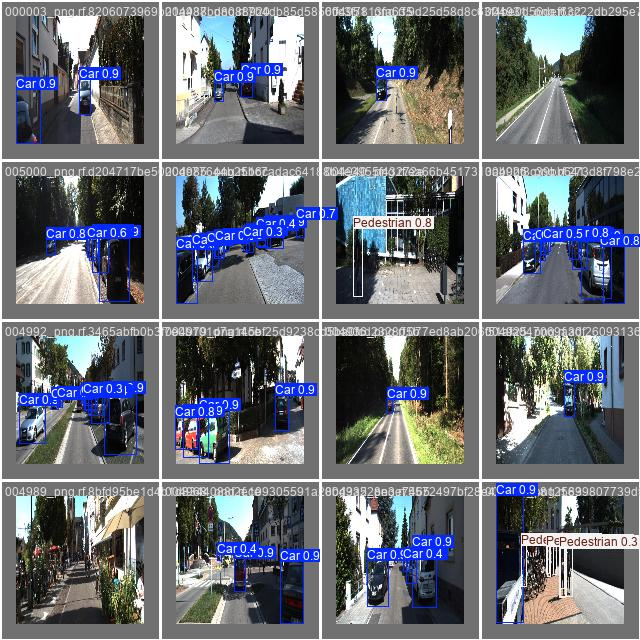

In [4]:
from IPython.display import Image

Image(filename=f"runs/detect/train21/val_batch0_pred.jpg", width=1000)

## Validate Custom Model

In [5]:
from ultralytics import YOLO

# Load your trained model
model = YOLO(f"runs\\detect\\train21\\weights\\best.pt")

# # Validate on your test dataset by specifying the path to your test data YAML
# results = model.val(data='path/to/test_data.yaml')

In [6]:
results = model.val()

Ultralytics YOLOv8.2.61  Python-3.10.0 torch-2.3.1+cu121 CUDA:0 (NVIDIA GeForce GTX 1060, 6144MiB)
YOLOv9m summary (fused): 382 layers, 21,539,305 parameters, 0 gradients, 115.4 GFLOPs


val: Scanning D:\Viren\AIKD\Pedestian\KITTI-3\valid\labels.cache... 1496 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1496/1496 [00:00<?, 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 94/94 [00:28<00:00,  3.30it/s]


                   all       1496       8040      0.682      0.449      0.493      0.302
                   Car       1368       6830      0.795      0.694      0.757       0.54
               Cyclist        235        332      0.644      0.298      0.337      0.167
            Pedestrian        355        878      0.606      0.354      0.386      0.199
Speed: 0.1ms preprocess, 9.7ms inference, 0.0ms loss, 1.8ms postprocess per image
Results saved to runs\detect\val4


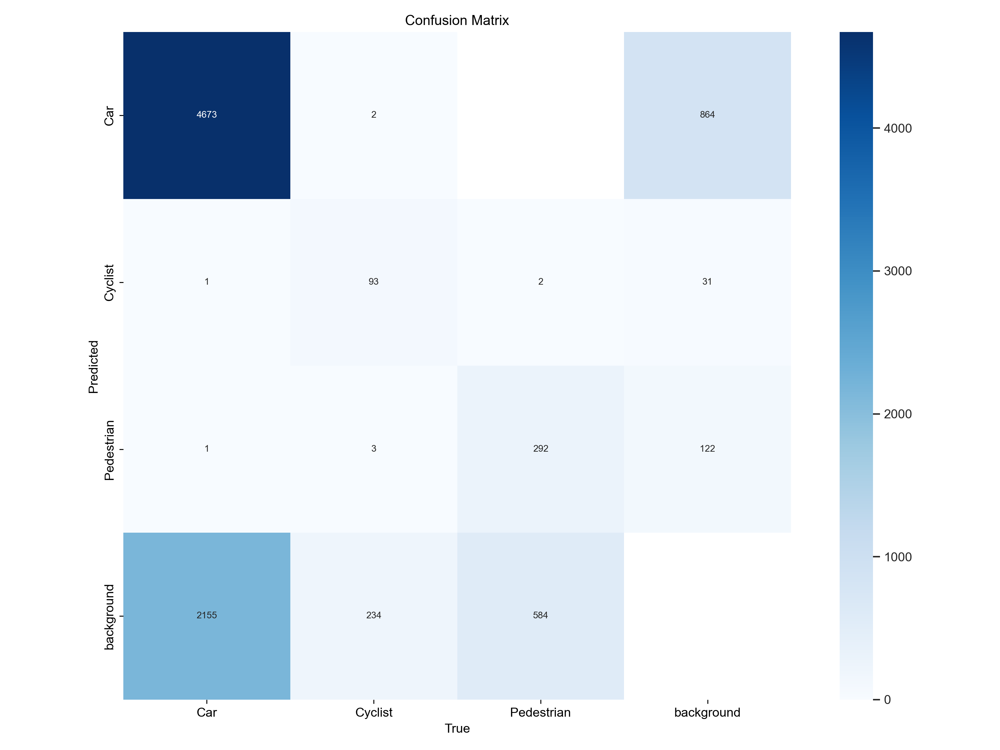

In [7]:
from IPython.display import Image

Image(filename=f"runs/detect/val4/confusion_matrix.png", width=1000)

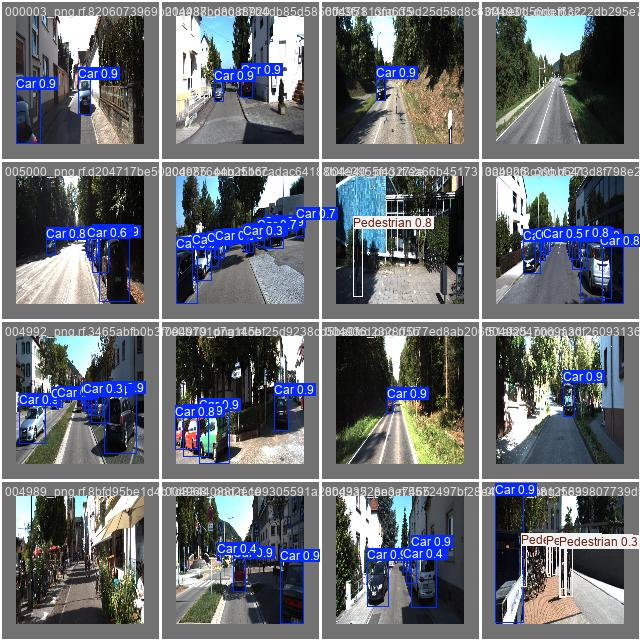

In [8]:
from IPython.display import Image

Image(filename=f"runs/detect/val4/val_batch0_pred.jpg", width=1000)

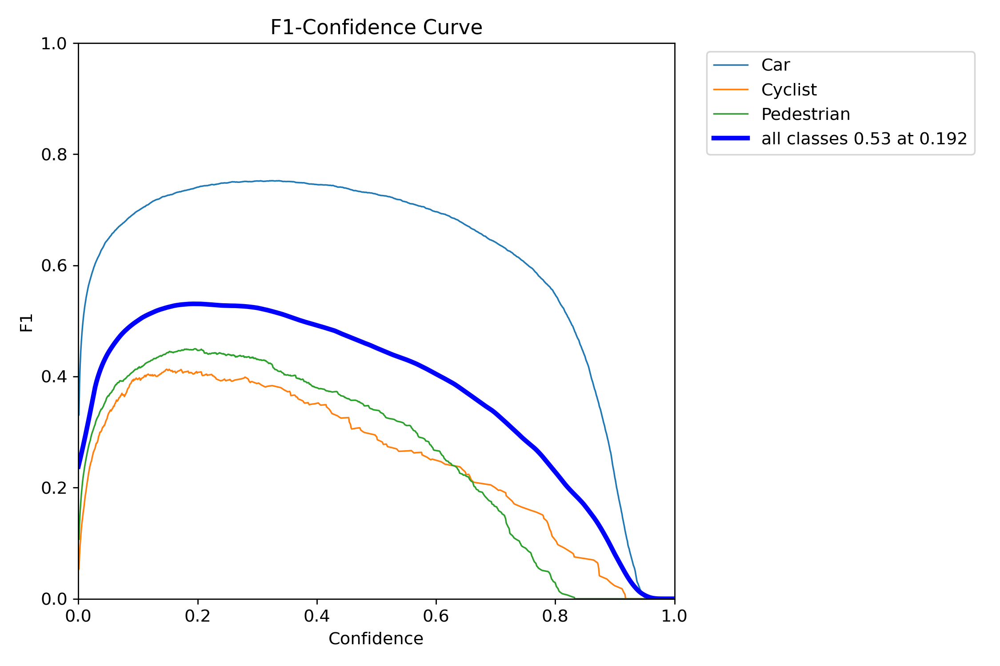

In [9]:
from IPython.display import Image

Image(filename=f"runs/detect/val4/F1_curve.png", width=1000)

In [ ]:
# %cd {HOME}/yolov9

# !python val.py \
# --img 640 --batch 32 --conf 0.001 --iou 0.7 --device 0 \
# --data {dataset.location}/data.yaml \
# --weights {HOME}/yolov9/runs/train/exp/weights/best.pt

## Inference with Custom Model

In [ ]:
# !python detect.py \
# --img 1280 --conf 0.1 --device 0 \
# --weights {HOME}/yolov9/runs/train/exp/weights/best.pt \
# --source {dataset.location}/test/images

In [12]:
source = f"KITTI-3//test/images"
from ultralytics import YOLO

# Load your trained model
model = YOLO(f"runs\\detect\\train21\\weights\\best.pt")
# Run inference on the source
results = model(source,save=True,conf=0.7,classes=2)


image 1/748 D:\Viren\AIKD\Pedestian\KITTI-3\test\images\000000_png.rf.23124ef290a650f035d6ef8c48070803.jpg: 128x128 (no detections), 57.8ms
image 2/748 D:\Viren\AIKD\Pedestian\KITTI-3\test\images\000006_png.rf.03327ccd955aa70d276bcd35fa9c66b5.jpg: 128x128 (no detections), 26.9ms
image 3/748 D:\Viren\AIKD\Pedestian\KITTI-3\test\images\000012_png.rf.e257807330c4bd5cb4300e6d67779f99.jpg: 128x128 (no detections), 103.9ms
image 4/748 D:\Viren\AIKD\Pedestian\KITTI-3\test\images\000019_png.rf.5a26dfa7f82c32cea671c9679f784284.jpg: 128x128 (no detections), 103.0ms
image 5/748 D:\Viren\AIKD\Pedestian\KITTI-3\test\images\000024_png.rf.9adbf2e15a5c3049fd3a11103f90a417.jpg: 128x128 (no detections), 32.9ms
image 6/748 D:\Viren\AIKD\Pedestian\KITTI-3\test\images\000033_png.rf.d222ba0ce287a1cb085c6102ce303698.jpg: 128x128 (no detections), 25.9ms
image 7/748 D:\Viren\AIKD\Pedestian\KITTI-3\test\images\000034_png.rf.e50529c8bb4bc0d63da1fcdb60042c09.jpg: 128x128 (no detections), 29.0ms
image 8/748 D:\Vi

In [14]:
import cv2
for i, result in enumerate(results):
    # Check if any detections were made
    if len(result.boxes) > 0:
        # Detections were made, save the image
        # You can use result.plot() to draw the detections on the image
        annotated_image = result.plot()
        cv2.imwrite(f'detected_image_{i}.jpg', annotated_image)

**NOTE:** Just like behore, the inference results have been saved in the appropriate directory inside `{HOME}/yolov9/runs/detect/`. Let's examine few of those results.

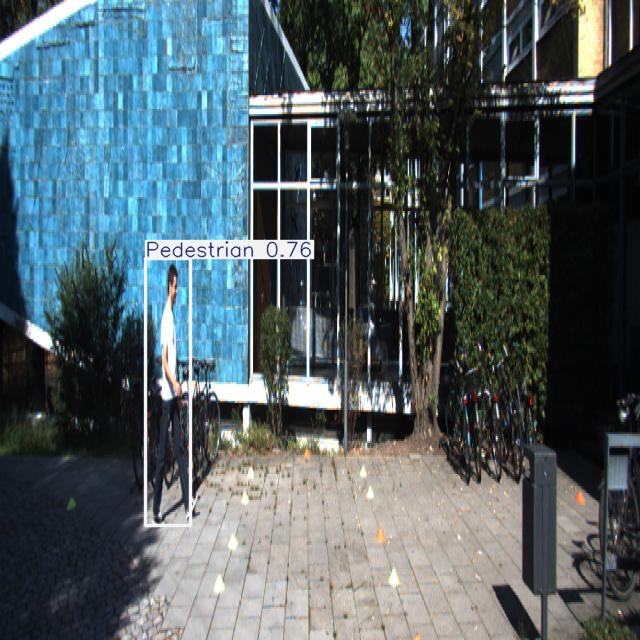

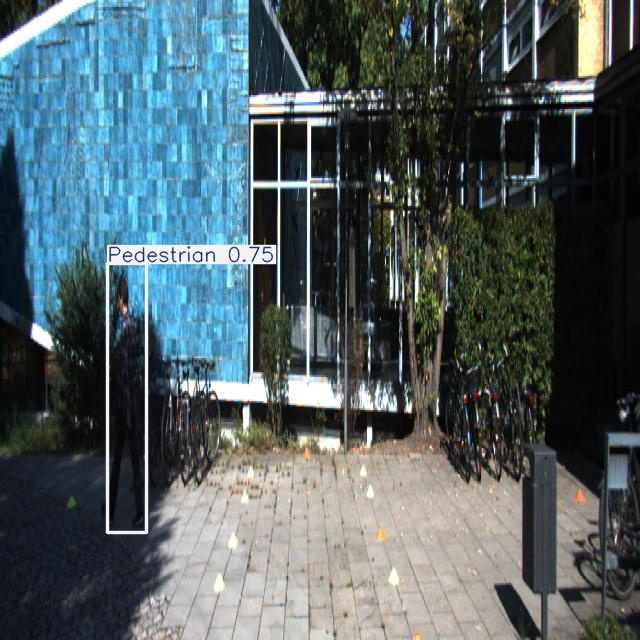

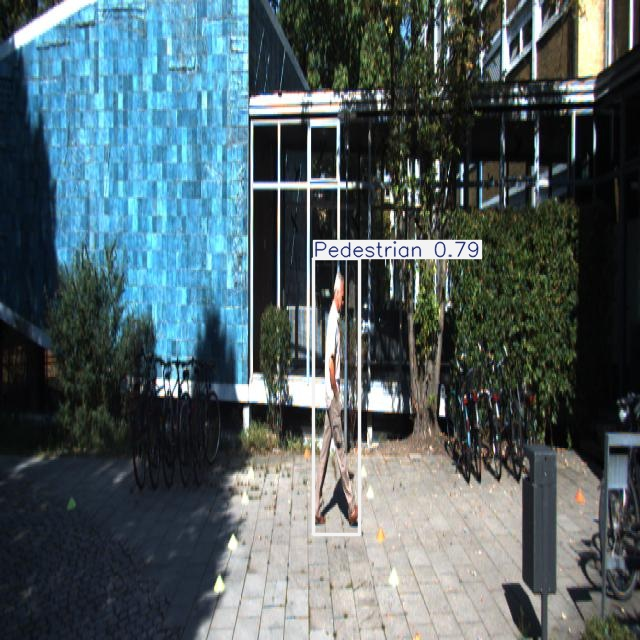

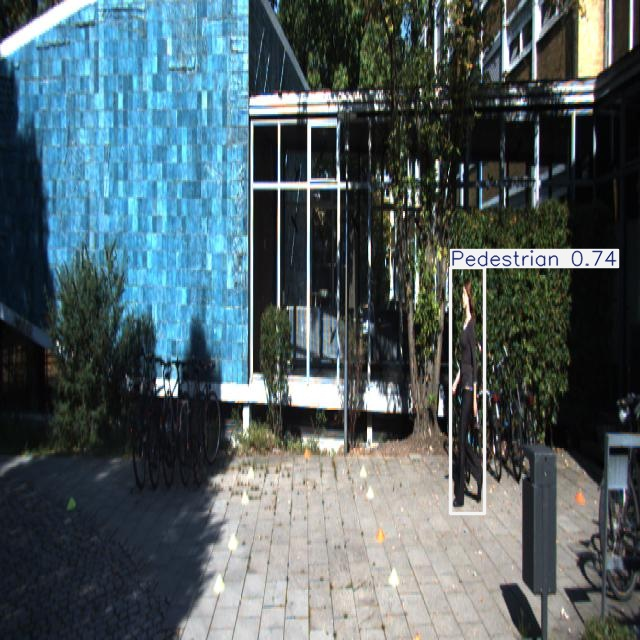

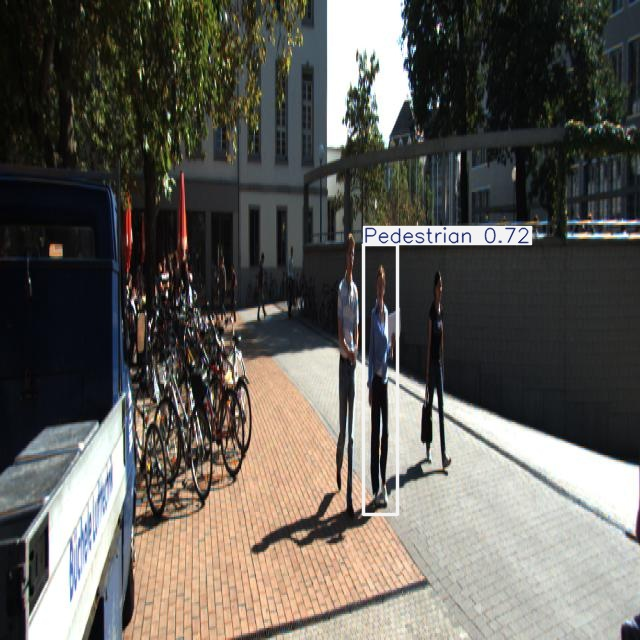

...

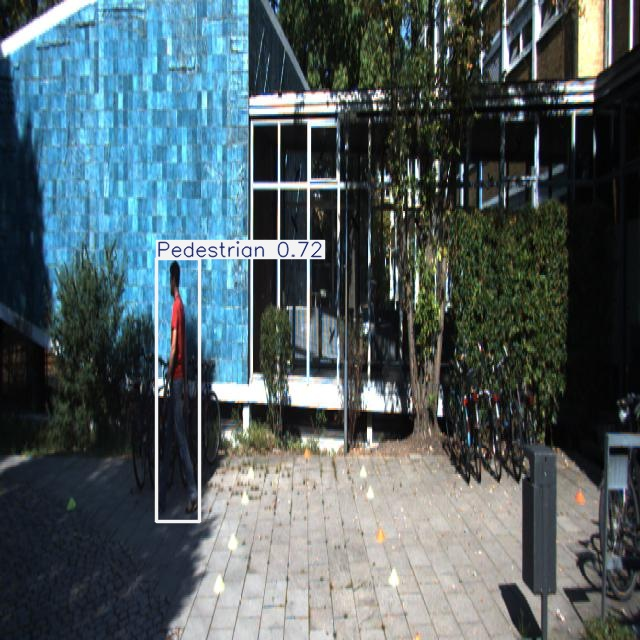

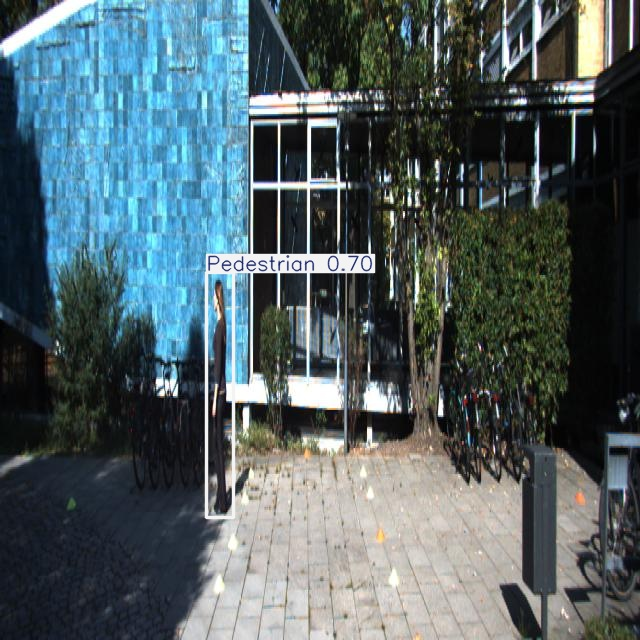

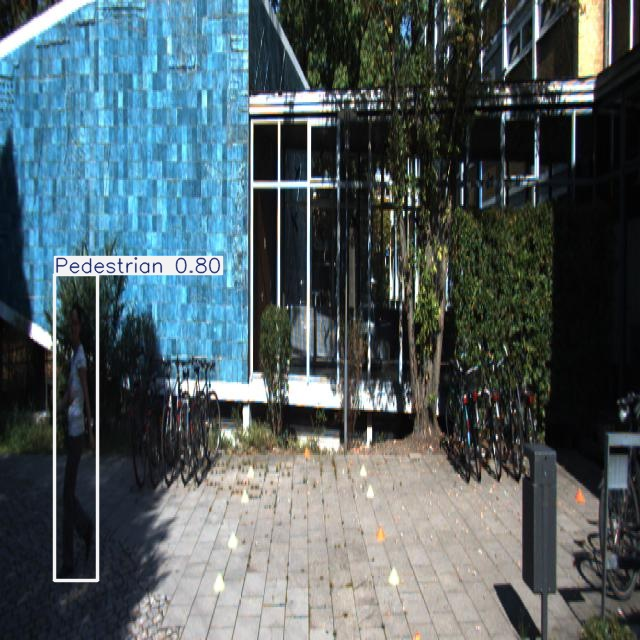

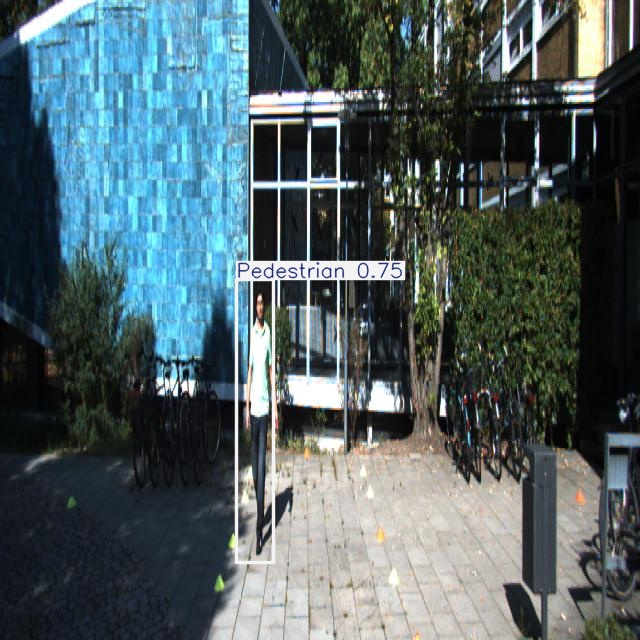

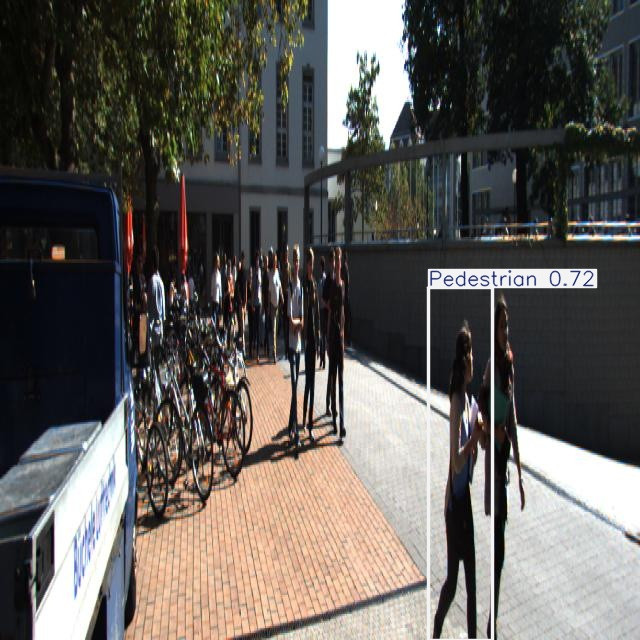

In [15]:
import glob

from IPython.display import Image, display

for image_path in glob.glob(f'*.jpg'):
      display(Image(filename=image_path, width=600))